# Homework 5

In [7]:
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np
from tqdm import trange
import math

Для того, чтобы работал код в задаче 1, надо поместить в папку с ```.ipynb``` файлом папку ```plants```.

# Задача №1 - Можете ли вы отличить сорняки от рассады?

Теперь приступим к задаче классификации на картинках. Реализуйте программу, которая определяет тип рассады на изображении. 

Для того, чтобы определить характерные особенности каждого типа рассады, у вас есть train. Train это папка, в которой картинки уже классифицированы и лежат в соответствующих папках. Исходя из этой информации можете найти признаки, присущие конкретному растению.

Проверка вашего решения будет на происходить на test. В папке test уже нет метки класса для каждой картинки. 

[Ссылка на Яндекс-диск](https://yadi.sk/d/0Zzp0klXT0iRmA), все картинки тут.

Примеры изображений для теста:
<table><tr>
    <td> <img src="https://i.ibb.co/tbqR37m/fhj.png" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/6yL3Wmt/sfg.png" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/pvn7NvF/asd.png" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [2]:
# Ваш код
def get_images(path="plants/test"):
    images_path = os.listdir(path)
    images = []
    for im in images_path:
        img = cv2.imread(os.path.join(path, im))
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.GaussianBlur(img, ksize = (5, 5), sigmaX = 1.)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
        images.append(img)

    return images

def plot_images(images, num = -1, cmap = 'gray', labels = None):
    if num == -1:
        num = len(images)

    if num % 5 == 0:
        fig, axes = plt.subplots(num // 5, 5, figsize = (20, 12), sharex = True)
    elif num % 4 == 0:
        fig, axes = plt.subplots(num // 4, 4, figsize = (20, 12), sharex = True)
    elif num % 3 == 0:
        fig, axes = plt.subplots(num // 3, 3, figsize = (20, 12), sharex = True)
    elif num % 2 == 0:
        fig, axes = plt.subplots(num // 2, 2, figsize = (20, 12), sharex = True)
    elif num == 7:
        fig, axes = plt.subplots(1, num, figsize = (20, 12), sharex= True)
    else:
        fig, axes = plt.subplots(num, 1, figsize = (20, 30), sharex = True)
    for i, (axis, image) in enumerate(zip(axes.flat, images)):
        axis.imshow(image, interpolation = 'none', cmap = cmap)
        axis.axis('off')
        if labels is not None:
            axis.set_title(labels[i])
        else:
            axis.set_title(i)

In [3]:
def generate_masks(images):
    masks = []
    for image in images:
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        mask = cv2.inRange(hsv, (30, 5, 5), (70, 255,255))
#         mask = cv2.dilate(mask, np.ones((2, 2)),iterations = 1)
#         mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, np.ones((3, 3)))
        masks.append(mask)
    return masks

In [4]:
def extract_features(images):
    masks = generate_masks(images)
    area = []
    arclength = []
    for mask in masks:
        contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        max_contour = max(contours, key=len)
        area.append(cv2.contourArea(max_contour))
        arclength.append(cv2.arcLength(max_contour, closed = True))
    return area, arclength

In [5]:
def extract_images_features(images):
    area, arclength = extract_features(images)
    return list(zip(area, arclength))

In [8]:
test_images = get_images()

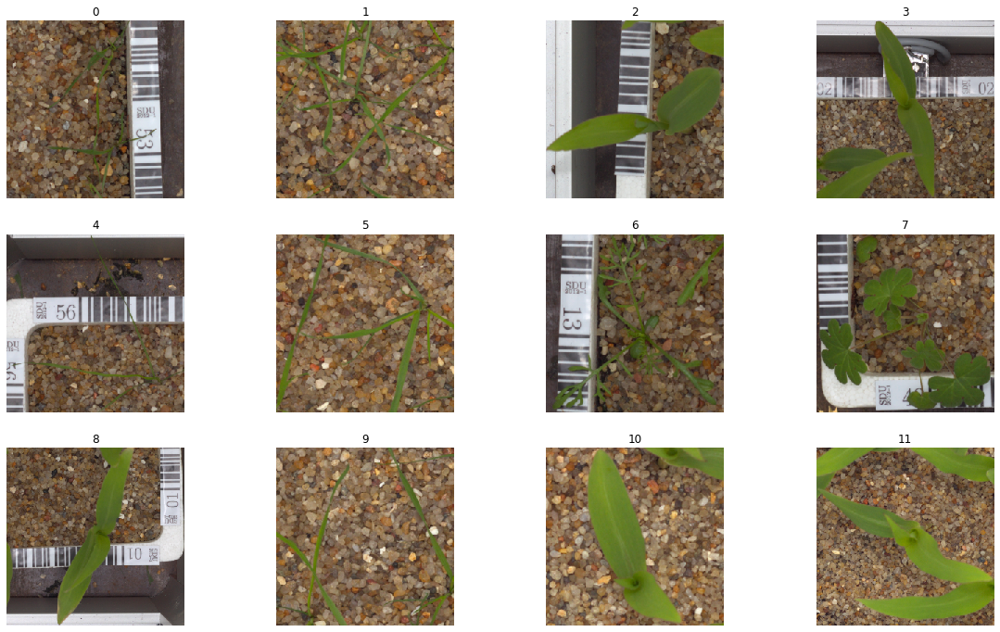

In [158]:
plot_images(test_images, 12)

In [159]:
test_images[0].shape

(256, 256, 3)

In [160]:
loose_silky_bent = get_images('plants/train/Loose Silky-bent')
maize = get_images('plants/train/Maize')
scentless_mayweed = get_images('plants/train/Scentless Mayweed')
small_flowered_ranesbill = get_images('plants/train/Small-flowered Cranesbill')

In [161]:
names = ['Loose Silky-bent', 'Maize', 'Scentless Mayweed', 'Small-flowered Cranesbill']

In [162]:
train_images = [*loose_silky_bent, *maize, *scentless_mayweed, *small_flowered_ranesbill]

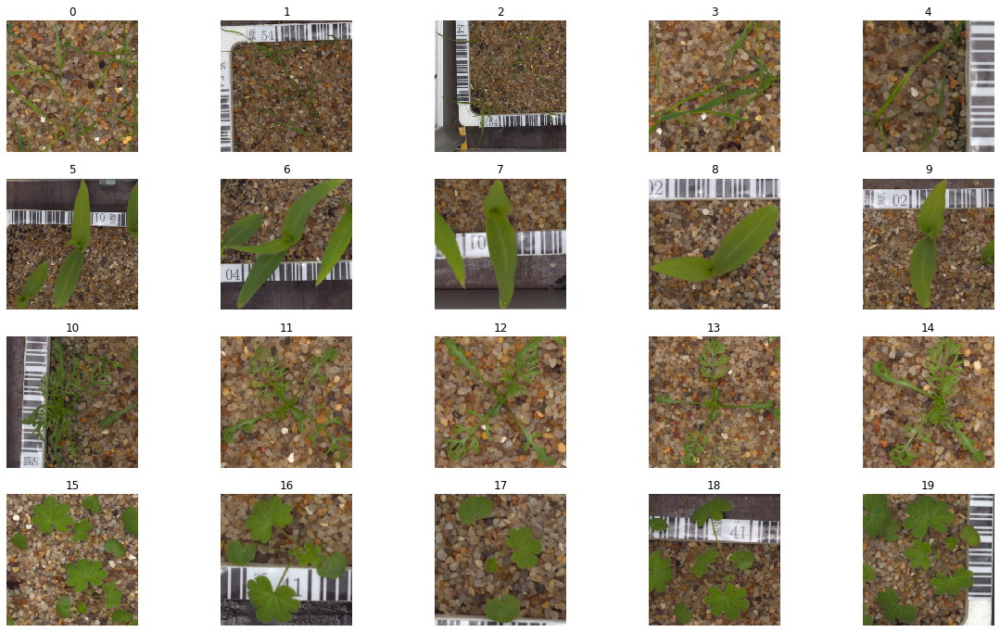

In [163]:
plot_images(train_images)

In [164]:
ls_mask = generate_masks(loose_silky_bent)
m_mask = generate_masks(maize)
sm_mask = generate_masks(scentless_mayweed)
sfr_mask = generate_masks(small_flowered_ranesbill)
masks = [*ls_mask, *m_mask, *sm_mask, *sfr_mask]

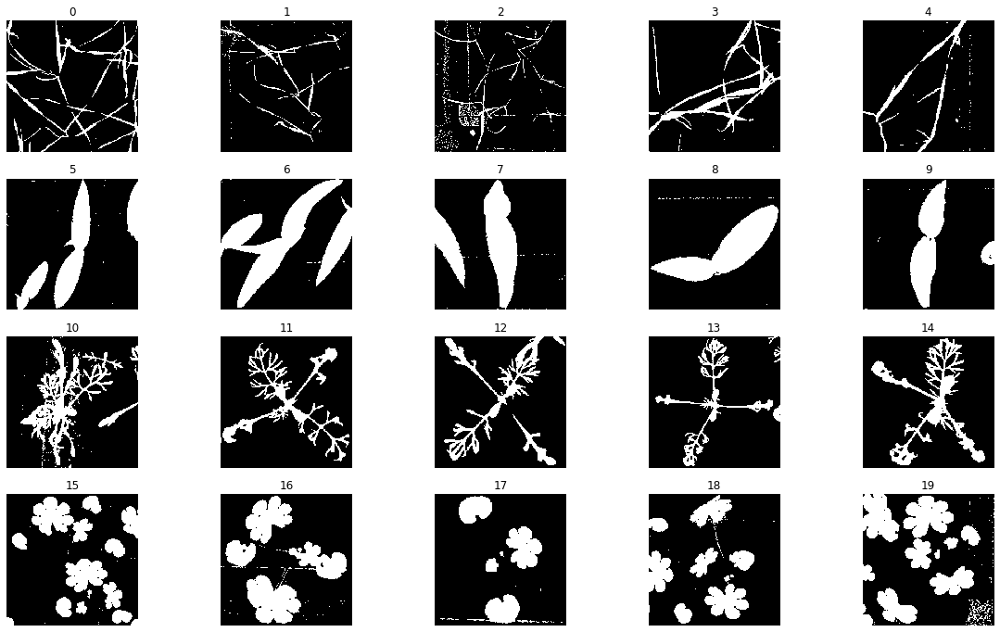

In [165]:
plot_images(masks, cmap = 'gray')

In [166]:
ones = []
for mask in masks:
    ones.append(np.count_nonzero(mask))

In [167]:
np.array(ones)

array([ 7652,  3368,  4117,  7307,  3965, 12090, 18674, 14172, 13128,
       10126, 12282,  9185,  9752,  6261, 10564, 16706, 18348, 10255,
       14280, 21506])

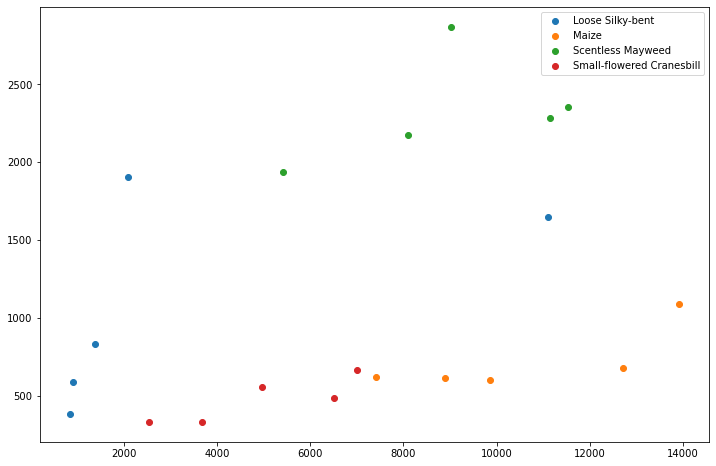

In [168]:
areas, perimeters = extract_features(train_images)
repr_areas = [areas[5 * i: 5 * (i + 1)] for i in range(len(areas) // 5)]
repr_perimeters = [perimeters[5 * i: 5 * (i + 1)] for i in range(len(perimeters) // 5)]
plt.figure(figsize = (12, 8))
for arset, perset, name in zip(repr_areas, repr_perimeters, names):
    plt.scatter(arset, perset, label = name)
plt.legend()

Видим, что на тренировочной выборке классы неплохо разделяются в пространстве $(Area, perimeter)$. Будем использовать KNN Classifier.

In [169]:
from sklearn.neighbors import KNeighborsClassifier as KNN

In [170]:
classifier = KNN(n_neighbors=3, metric='euclidean', weights='distance')

In [171]:
X_train = [[ar, per] for ar, per in zip(areas, perimeters)]
y_train = [i // 5 for i in range(20)]
X_train, y_train

([[2086.0, 1907.145433306694],
  [853.5, 380.2325357198715],
  [1379.5, 830.6244518756866],
  [11094.0, 1645.6408183574677],
  [924.5, 587.4284934997559],
  [7417.0, 619.5289982557297],
  [13905.0, 1086.4549659490585],
  [9849.5, 599.6883792877197],
  [12704.5, 675.3107432126999],
  [8882.0, 611.7300099134445],
  [11527.0, 2354.6845371723175],
  [9023.5, 2869.8186515569687],
  [8096.5, 2172.667292714119],
  [5424.5, 1938.3687411546707],
  [11141.5, 2285.0936965942383],
  [4959.0, 553.5289988517761],
  [6519.5, 484.8010767698288],
  [3686.5, 333.462984085083],
  [2553.5, 330.433545589447],
  [7010.0, 667.6122590303421]],
 [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3])

In [172]:
model = classifier.fit(X_train, y_train)

In [173]:
X_test = extract_images_features(test_images)
y_test = model.predict(X_test)

In [174]:
colors = ['r', 'g', 'b', 'y']

In [175]:
colors

['r', 'g', 'b', 'y']

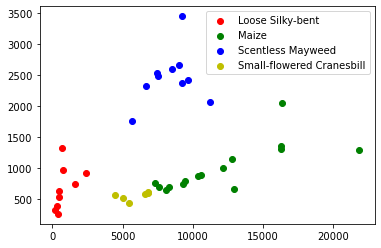

In [176]:
x_0, y_0 = list(zip(*np.array(X_test)[y_test == 0]))
x_1, y_1 = list(zip(*np.array(X_test)[y_test == 1]))
x_2, y_2 = list(zip(*np.array(X_test)[y_test == 2]))
x_3, y_3 = list(zip(*np.array(X_test)[y_test == 3]))

for i, (x, y) in enumerate([(x_0, y_0), (x_1, y_1), (x_2, y_2), (x_3, y_3)]):
    plt.scatter(x, y, label = names[i], c = colors[i])
plt.legend(names)

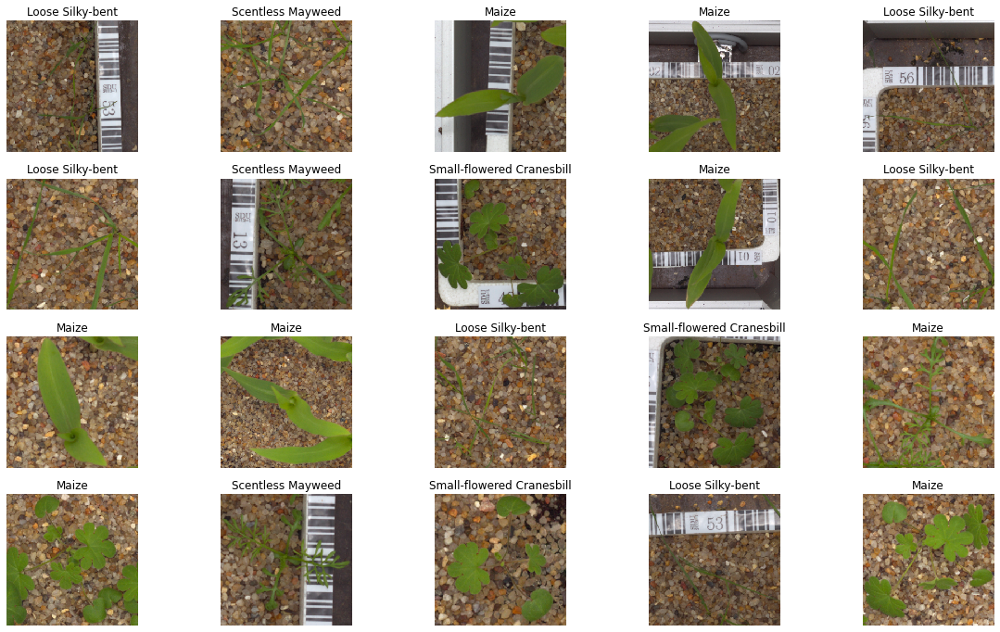

In [177]:
plot_images(test_images, num = 20, labels = np.array(names)[y_test])

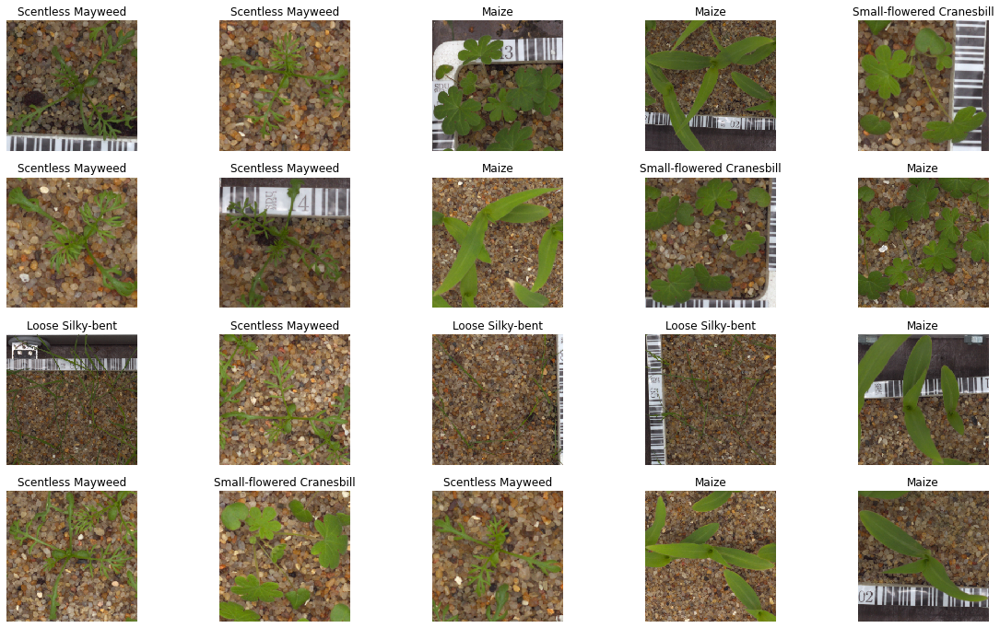

In [178]:
plot_images(test_images[20:], labels = np.array(names)[y_test[20:]])

Получили точность $34/40$ $=$ $0.85$.

Сменим KNN на LogisticRegression.

In [179]:
from sklearn.linear_model import LogisticRegression

In [180]:
model = LogisticRegression(max_iter=200).fit(X_train, y_train)

In [181]:
X_test = extract_images_features(test_images)
y_test = model.predict(X_test)

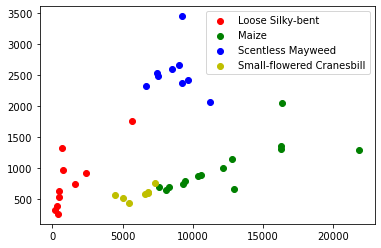

In [182]:
x_0, y_0 = list(zip(*np.array(X_test)[y_test == 0]))
x_1, y_1 = list(zip(*np.array(X_test)[y_test == 1]))
x_2, y_2 = list(zip(*np.array(X_test)[y_test == 2]))
x_3, y_3 = list(zip(*np.array(X_test)[y_test == 3]))

for i, (x, y) in enumerate([(x_0, y_0), (x_1, y_1), (x_2, y_2), (x_3, y_3)]):
    plt.scatter(x, y, label = names[i], c = colors[i])
plt.legend(names)

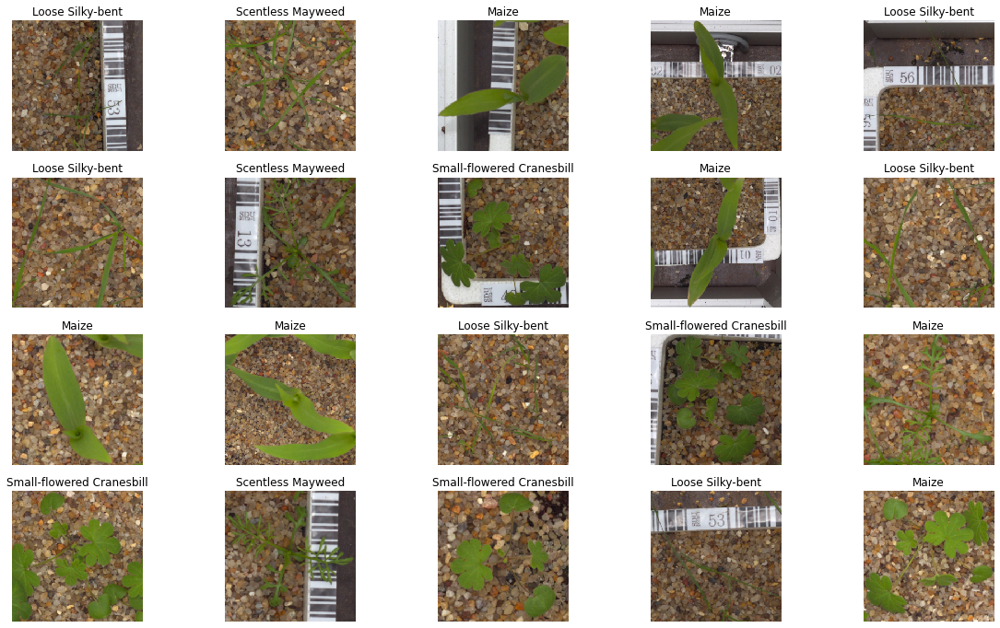

In [183]:
plot_images(test_images, num = 20, labels = np.array(names)[y_test])

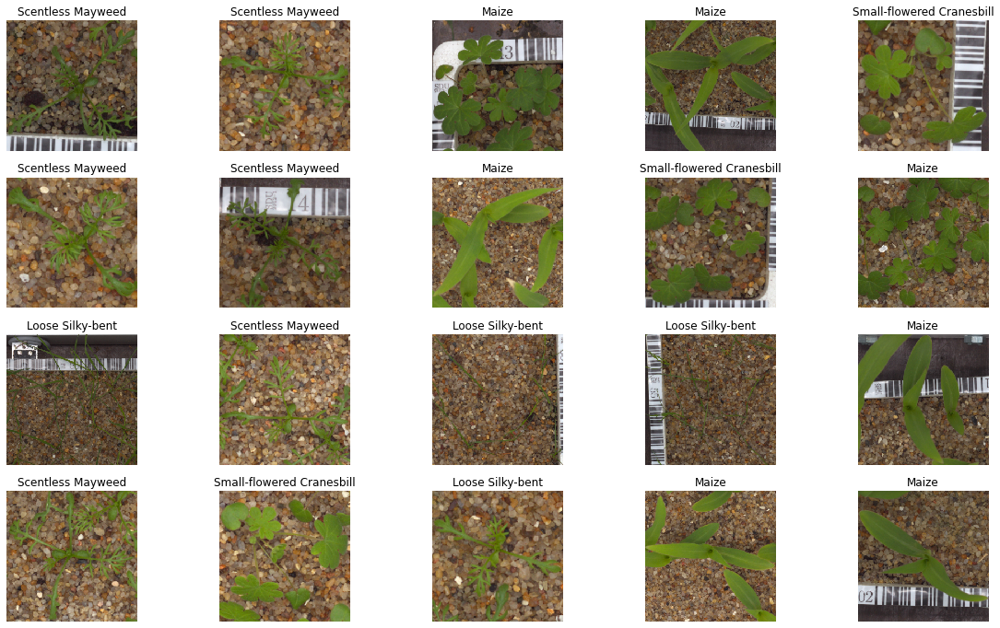

In [184]:
plot_images(test_images[20:], labels = np.array(names)[y_test[20:]])

Получили точно такую же точность.

# Задача №2 - Собери пазл (2.0).

Даны кусочки изображения, ваша задача склеить пазл в исходную картинку. 

Условия:
* Дано исходное изображение для проверки, использовать собранное изображение в самом алгоритме нельзя;
* Картинки имеют друг с другом пересечение;
* После разрезки кусочки пазлов не были повернуты или отражены;
* НЕЛЬЗЯ выбрать опорную картинку для сбора пазла, как это было в homework 3
* В процессе проверки решения пазлы могут быть перемешаны, т.е. порядок пазлов в проверке может отличаться от исходного 

Примеры изображений:
<img src="puzzle/su_fighter.jpg" alt="Drawing" style="width: 300px;"/>
<table><tr>
    <td> <img src="puzzle/su_fighter_shuffle/2.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/1.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/7.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/4.jpg" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [279]:
def get_puzzle_images(path="puzzle/china_shuffle"):
    images_path = os.listdir(path)
    images = []
    for im in images_path:
        img = cv2.imread(os.path.join(path, im))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
        images.append(img)

    return np.array(images)

In [280]:
def crop(image):
    # left crop
    while not image[0].any():
        image = image[1:]
    # right crop
    while not image[-1].any():
        image = image[:-1]
    # top crop
    while not image[:, 0].any():
        image = image[:, 1:]
    # bottom crop
    while not image[:, -1].any():
        image = image[:, :-1]
    return image

In [281]:
def stitcher(img1, img2, match_number=20, best_match_number=5, angle_eps=2):
    img1 = cv2.normalize(img1, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY), None)
    kp2, des2 = sift.detectAndCompute(cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY), None)
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=False)

    if des2 is not None and des1 is not None:
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)
        if len(matches) > match_number:
            matches = matches[:best_match_number]
            list_kp1 = np.array([kp1[mat.queryIdx].pt for mat in matches])
            list_kp2 = np.array([kp2[mat.trainIdx].pt for mat in matches])
            x, y = list_kp1[:, 0] - list_kp2[:, 0], list_kp1[:, 1] - list_kp2[:, 1]
            angles = [math.degrees(math.atan2(y[elem], x[elem])) for elem in range(len(x))]

            if np.std(angles) < angle_eps:
                diff_x, diff_y = int(np.mean(x)), int(np.mean(y))
                img3 = np.zeros((max(img1.shape[0], abs(diff_y) + img2.shape[0], img1.shape[0] - diff_y),
                                 max((img1.shape[1], abs(diff_x) + img2.shape[1], img1.shape[1] - diff_x)), 3))
                diff_x1, diff_y1 = max(0, -diff_x), max(0, -diff_y)
                diff_x2, diff_y2 = max(0, diff_x), max(0, diff_y)

                img3[diff_y1:diff_y1 + img1.shape[0], diff_x1:diff_x1 + img1.shape[1]] = img1
                img3[diff_y2:diff_y2 + img2.shape[0], diff_x2:diff_x2 + img2.shape[1]] = img2
                return img3

In [365]:
def get_possible_stitched(images, initial_puzzle = None, iterations = 10, stitch_iterations = 150):
    res = initial_puzzle
    if res is None:
        res = np.zeros_like(images[0])
    for i in trange(iterations):
        cimages = images.copy()
        cur_res = None
        if initial_puzzle is not None:
            cur_res = initial_puzzle
        else:
            idx = np.random.randint(0, len(cimages))
            cur_res = images[idx]
            cimages = np.delete(cimages, idx, 0)
        count = 0

        for count in range(stitch_iterations):
            if len(cimages) < 1:
                break
            idx = np.random.randint(0, len(cimages))
            cur = stitcher(cur_res, cimages[idx])
            if cur is not None:
                cur_res = cur
                cimages = np.delete(cimages, idx, 0)
        if (res.shape[0] <= cur_res.shape[0] or res.shape[1] <= cur_res.shape[1]) and cv2.mean(res) <= cv2.mean(cur_res):
            res = cur_res
    return res

In [232]:
def draw(res):
    fig = plt.figure(figsize=(6.4 * 2, 4.8 * 2))

    plt.imshow(crop(res.astype(np.uint8)))

    fig.tight_layout()
    plt.show()

In [214]:
path = 'puzzle/china_shuffle'
images = get_puzzle_images(path)

In [215]:
res = get_possible_stitched(images)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [07:32<00:00, 45.21s/it]


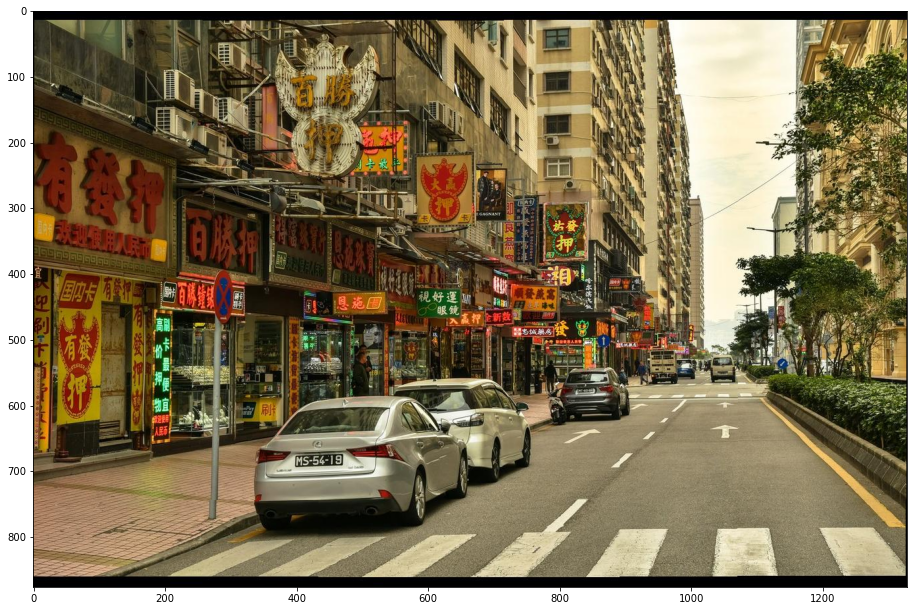

In [217]:
draw(res)

In [311]:
path = 'puzzle/su_fighter_shuffle'
images = get_puzzle_images(path)

In [312]:
res = get_possible_stitched(images, iterations = 5, stitch_iterations = 200)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:22<00:00,  4.42s/it]


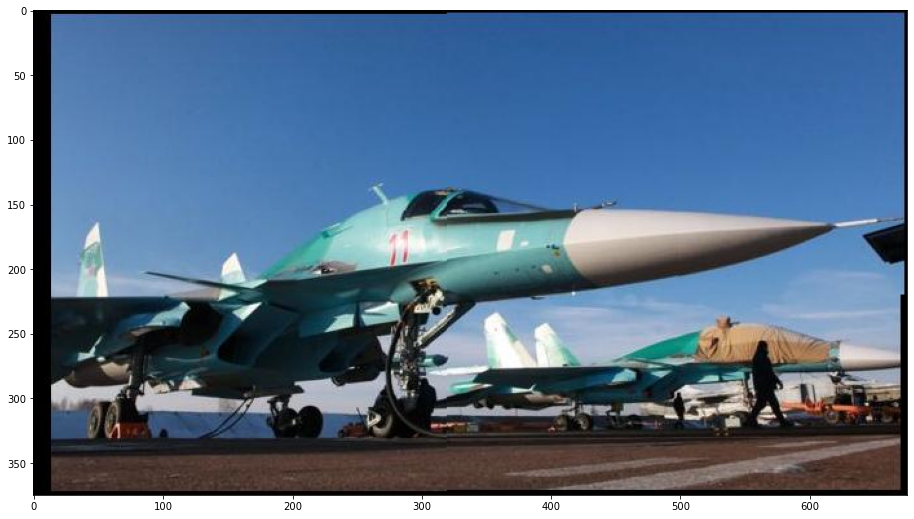

In [313]:
draw(res)

In [348]:
path = 'puzzle/home_shuffle'
images = get_puzzle_images(path)

In [349]:
res = get_possible_stitched(images, iterations = 3, stitch_iterations=150)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.76s/it]


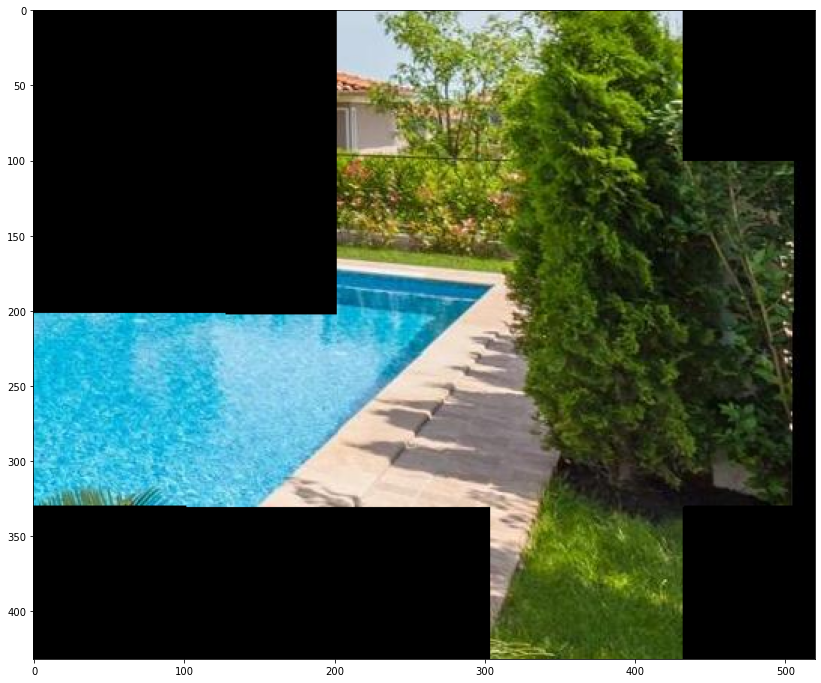

In [350]:
draw(res)

In [351]:
res_ = get_possible_stitched(images, initial_puzzle=res, iterations=10, stitch_iterations=500)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [11:25<00:00, 68.53s/it]


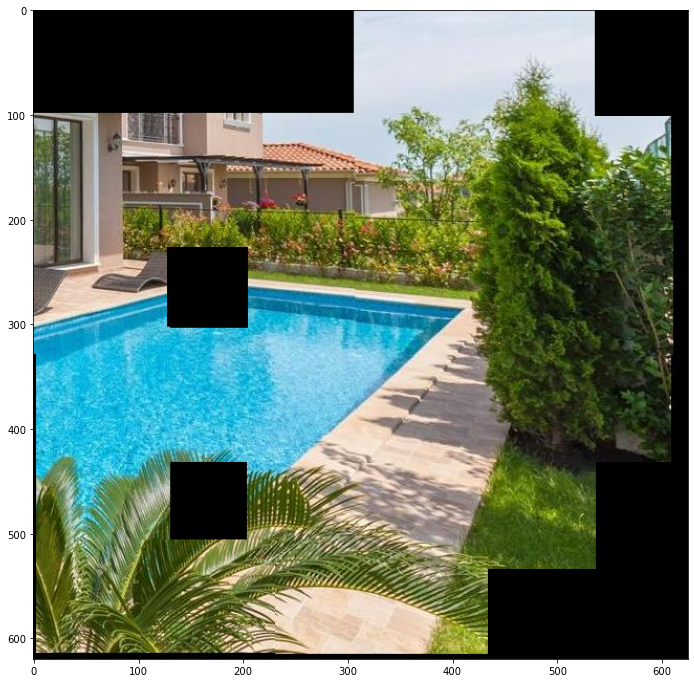

In [352]:
draw(res_)

In [357]:
res__ = get_possible_stitched(images, initial_puzzle=res_, iterations=1, stitch_iterations=300)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:42<00:00, 42.93s/it]


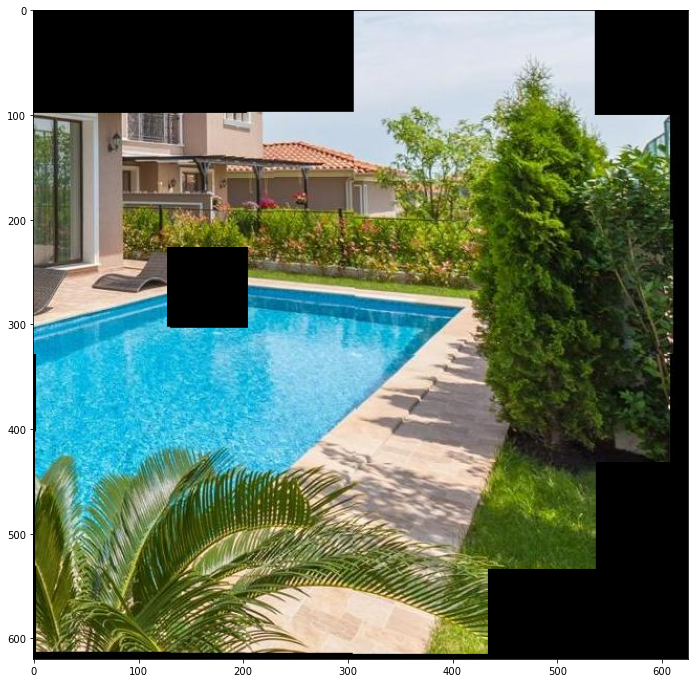

In [358]:
draw(res__)